# Advanced Lane Finding Project

In [6]:
### Setup and imports

import os

import cv2
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline
mpl.rcParams['figure.dpi'] = 96

In [2]:
### Global functions

def plot_image (img, title=None, cmap='gray'):
    plt.figure(figsize=(9,9))
    plt.axis('off')
    if title: plt.title(title)
    plt.imshow(img, interpolation='nearest', cmap=cmap)

### Camera Calibration

In [3]:
### Import calibration images

cal_images, cal_dir = [], os.getcwd() + '/camera_cal/'
for filename in ['calibration{}.jpg'.format(i) for i in range(1,21)]:
    img = cv2.imread(cal_dir + filename)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cal_images.append((img, gray, filename))
    
print('{} calibration images imported.'.format(len(cal_images)))

20 images imported.


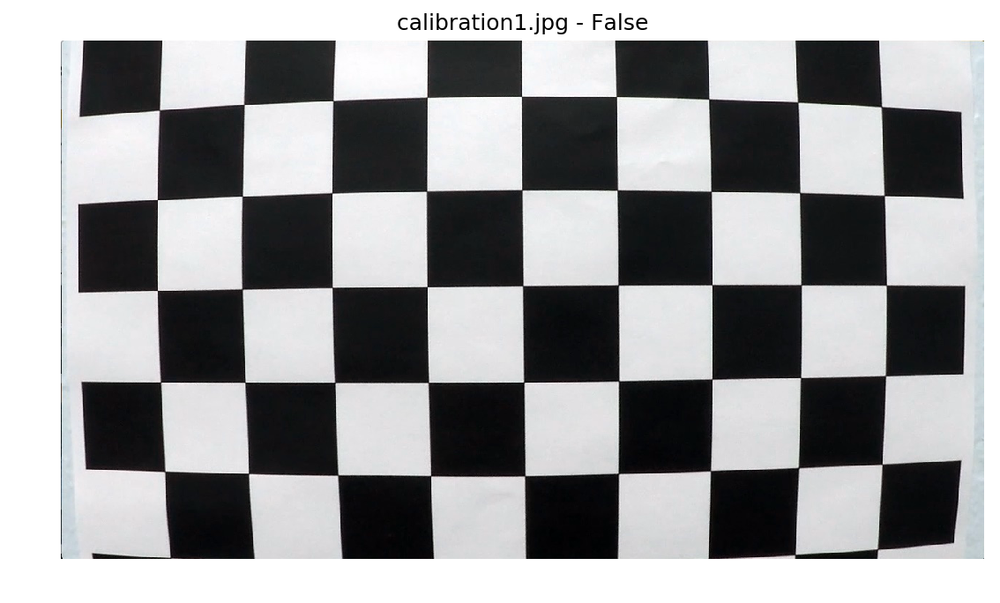

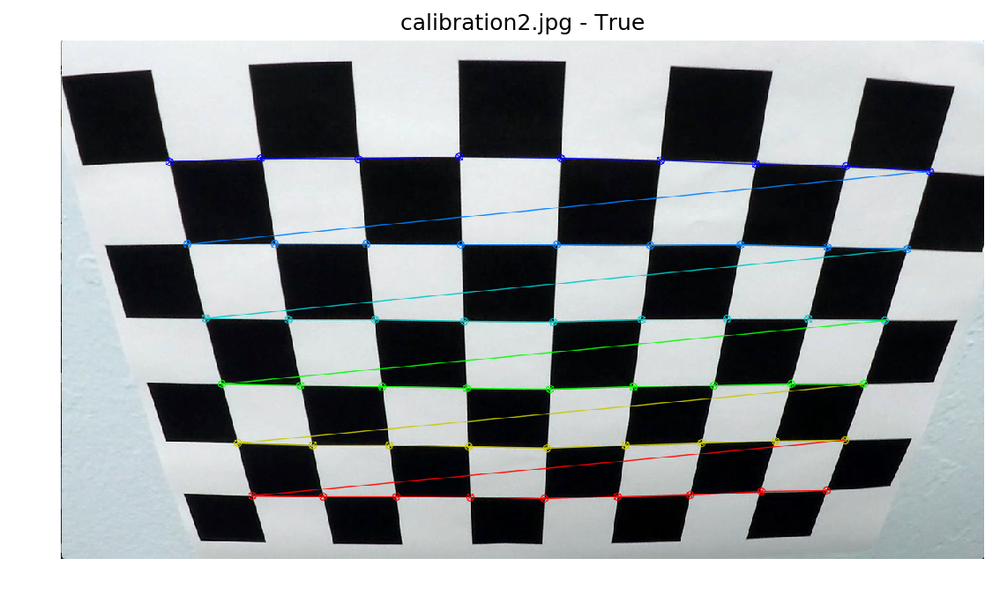

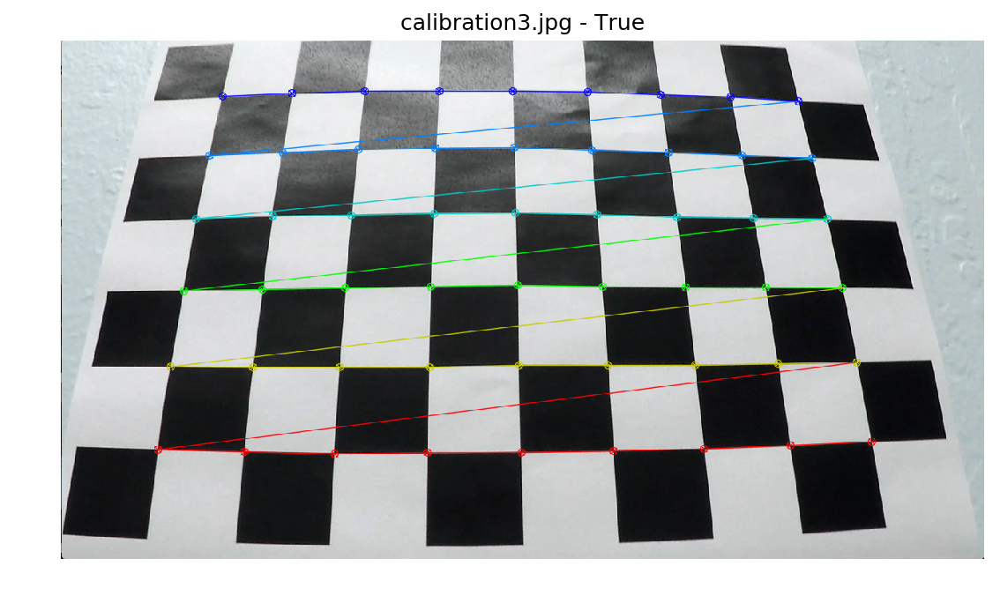

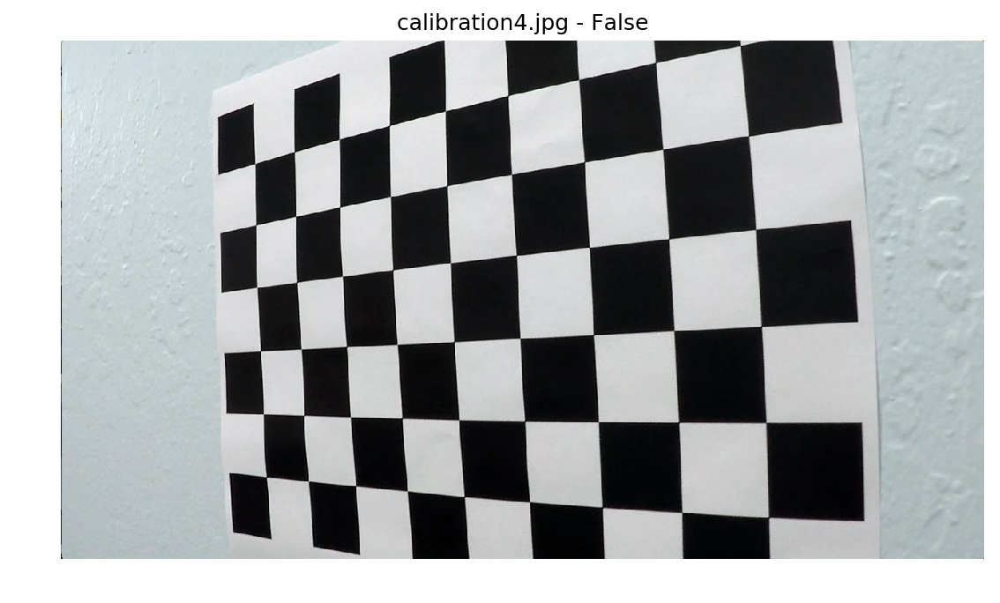

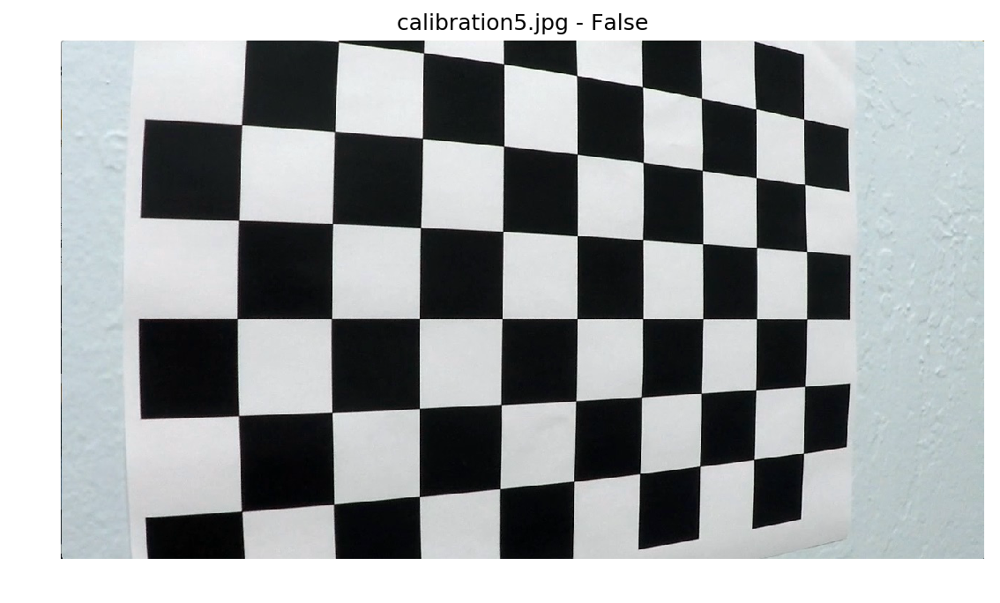

...

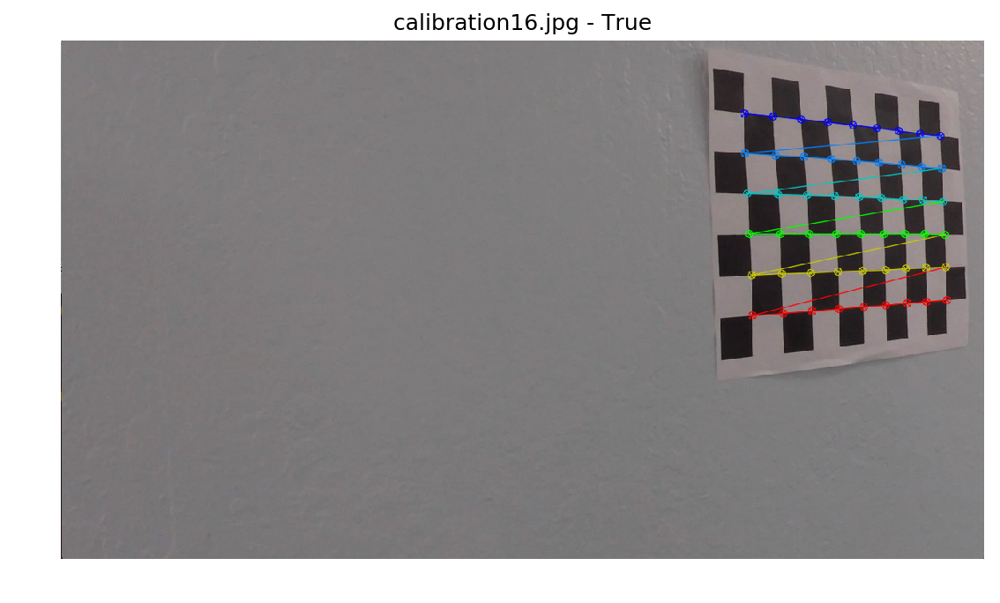

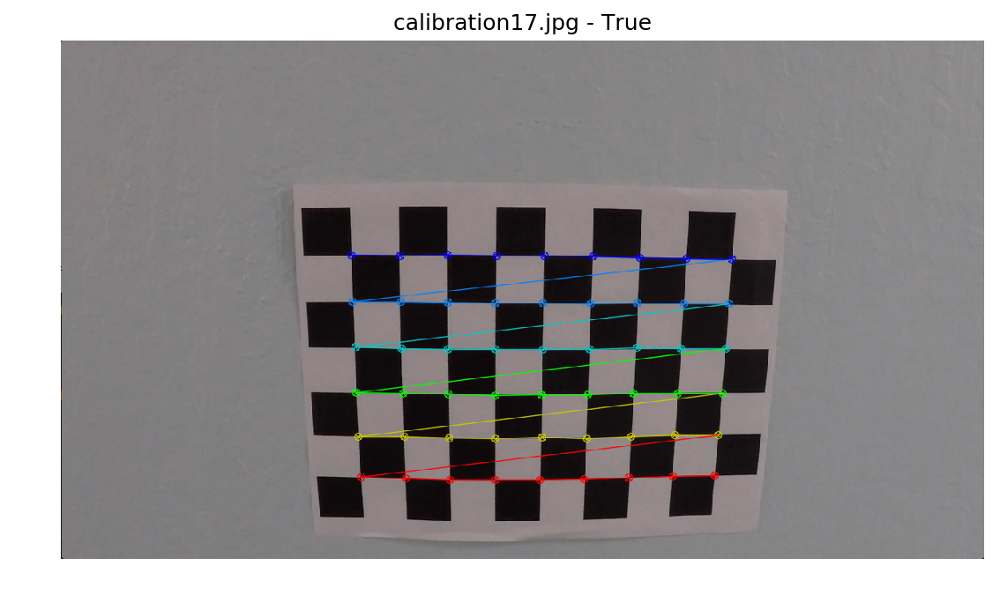

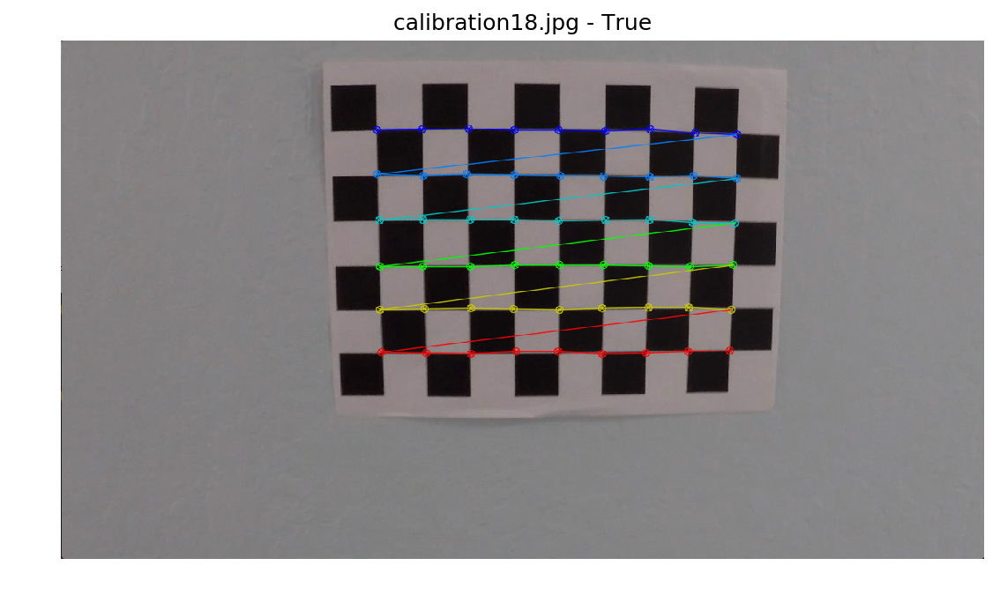

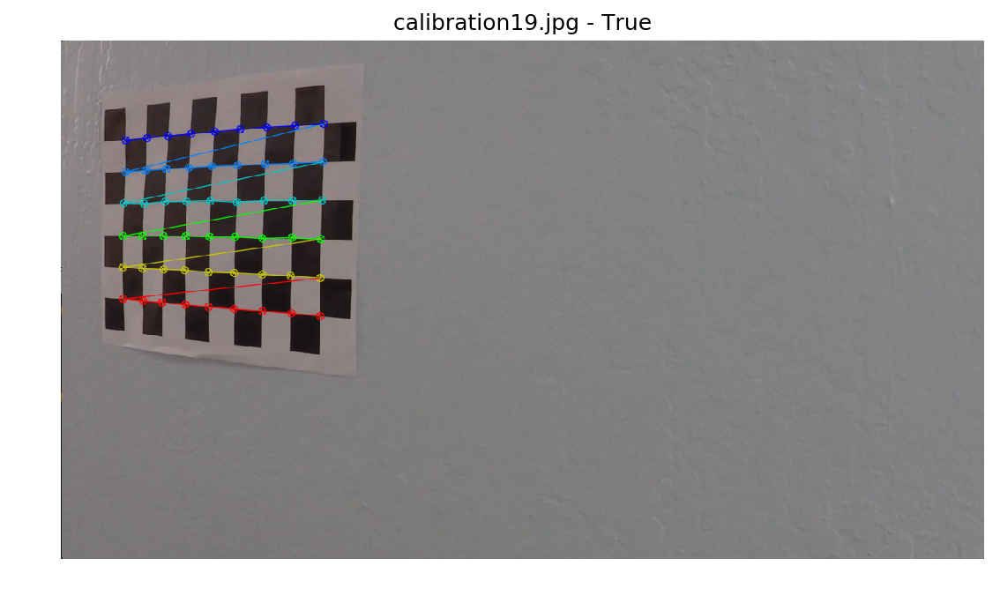

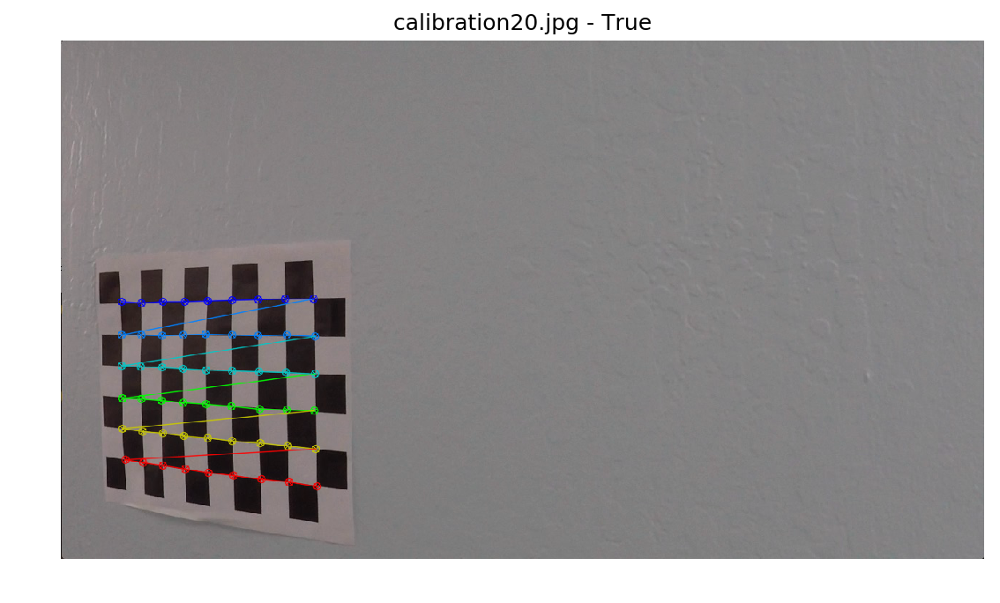

In [4]:
### Generate object and image points from chessboard images

num_corners = (9, 6) # (x, y) corners to look for in training images

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image space

# Prepare object points
objp = np.zeros((9*6, 3), np.float32)
objp[:,:2] = np.mgrid[0:num_corners[0],0:num_corners[1]].T.reshape(-1,2)

# Generate image points and show detected corners
for img, gray, filename in cal_images:
    temp_img = img.copy()
    ret, corners = cv2.findChessboardCorners(gray, num_corners, None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(temp_img, num_corners, corners, ret)
        
    plot_image(temp_img, title='{} - {}'.format(filename, str(ret)))

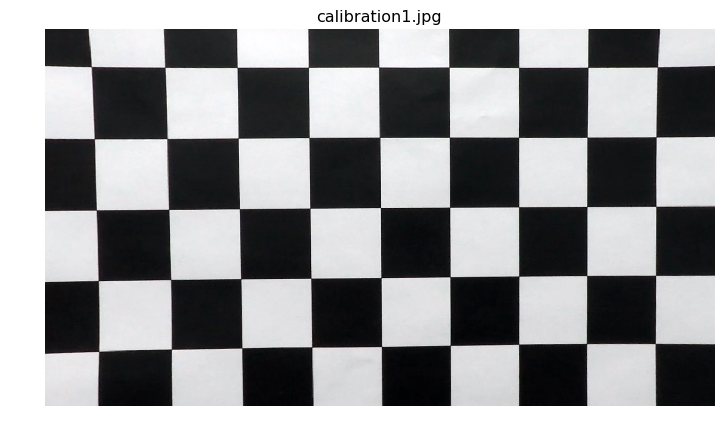

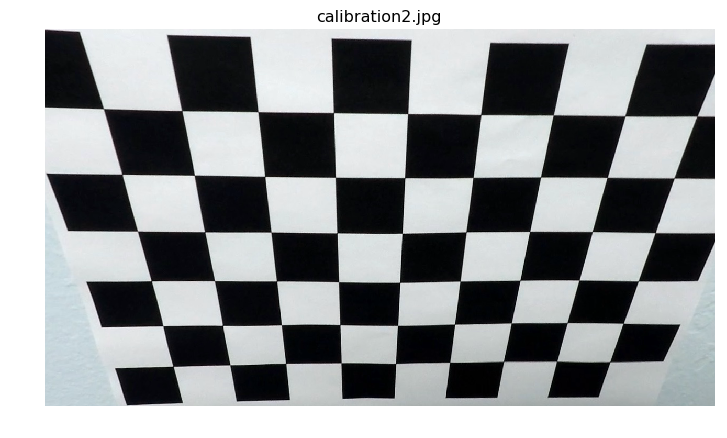

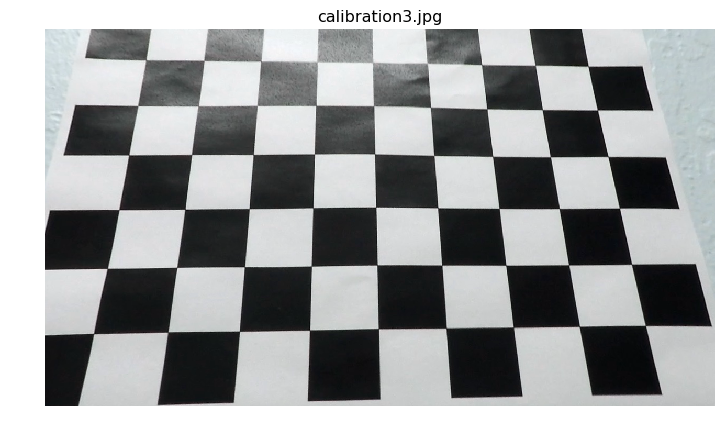

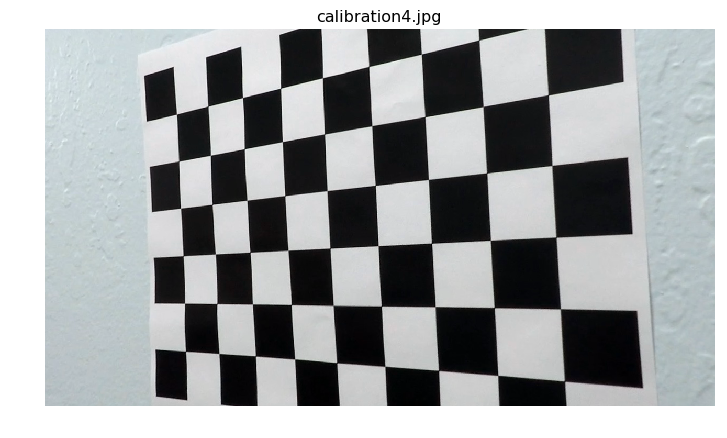

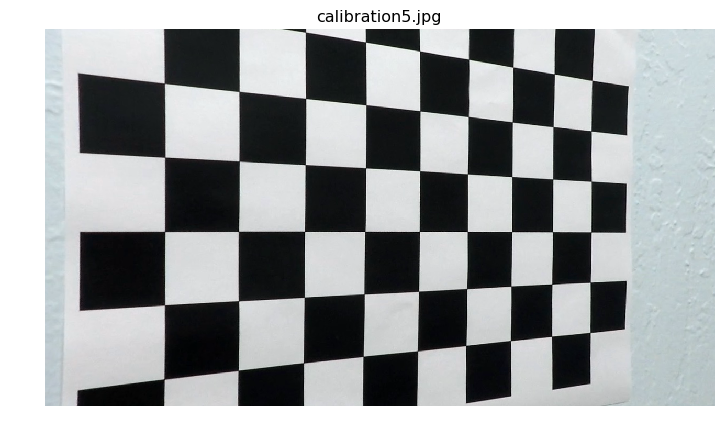

In [11]:
### Setup and test camera calibration

# Get calibration results
calibration = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Create undistort function
def undistort (img):
    mtx, dist = calibration[1:3]
    return cv2.undistort(img, mtx, dist, None, mtx)

# Show undistort results on calibration images
for img, gray, filename in cal_images[:5]: 
    plot_image(undistort(img), title=filename)

### Binary Threshold Pipeline

In [12]:
### Import test images with distortion correction and color space conversion

test_images, test_dir = [], os.getcwd() + '/test_images/'
for filename in os.listdir(test_dir):
    img = undistort(cv2.imread(test_dir + filename))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    test_images.append((img, gray, s_channel, filename))
    
print('{} test images imported.'.format(len(test_images)))

8 test images imported.


In [ ]:
### Binary threshold by x gradient

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
abs_sobelx = np.absolute(sobelx)
scaled_sobel = np.uint8(abs_sobelx * (255 / np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1